# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

子目录或文件 data 已经存在。


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

SVHN Training Set: 182MB [33:56, 89.4KB/s]                                                                             
SVHN Training Set: 64.3MB [09:51, 109KB/s]                                                                             


These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

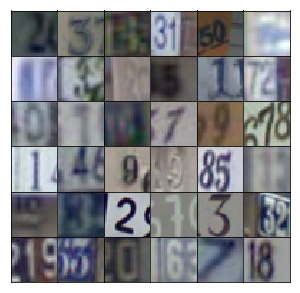

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z,4*4*512)
        #Reshape it to start a convolutional netword
        x1 = tf.reshape(x1,(-1,4,4,512))
        x1 = tf.layers.batch_normalization(x1,training=training)
        x1 = tf.maximum(alpha*x1,x1)
        #4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1,256,5,strides=2,padding='SAME')
        x2 = tf.layers.batch_normalization(x2,training=training)
        x2 = tf.maximum(alpha*x2,x2)
        #8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2,128,5,strides=2,padding='SAME')
        x3 = tf.layers.batch_normalization(x3,training=training)
        x3 = tf.maximum(alpha*x3,x3)
        #16x16x128 now
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(x3,output_dim,5,strides=2,padding='SAME')
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [34]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x,64,5,strides=2,padding='SAME')
     #   batch_norm1 = tf.layers.batch_normalization(x1,training=True)
        relu1 = tf.maximum(alpha*x1,x1)
        #16x16x64
        x2 = tf.layers.conv2d(relu1,128,5,strides=2,padding='SAME')
        batch_norm2 = tf.layers.batch_normalization(x2,training=True)
        relu2 = tf.maximum(alpha*batch_norm2,batch_norm2)
        #8x8x128
        x3 = tf.layers.conv2d(relu2,256,5,strides=2,padding='SAME')
        batch_norm3 = tf.layers.batch_normalization(x3,training=True)
        relu3 = tf.maximum(alpha*batch_norm3,batch_norm3)
        #4x4x256
        
        #flatten it
        flat = tf.reshape(relu3,(-1,4*4*256))
        
        logits = tf.layers.dense(flat,1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [35]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [36]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [37]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [38]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an errror without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [39]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very senstive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [40]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.002
batch_size = 256
epochs = 20
alpha = 0.3
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/20... Discriminator Loss: 0.0071... Generator Loss: 15.7619
Epoch 1/20... Discriminator Loss: 0.1152... Generator Loss: 7.9151
Epoch 1/20... Discriminator Loss: 0.4085... Generator Loss: 2.2827
Epoch 1/20... Discriminator Loss: 1.0889... Generator Loss: 1.6910
Epoch 1/20... Discriminator Loss: 1.0797... Generator Loss: 1.1187
Epoch 1/20... Discriminator Loss: 2.2065... Generator Loss: 2.0012
Epoch 1/20... Discriminator Loss: 0.6727... Generator Loss: 1.0781
Epoch 1/20... Discriminator Loss: 4.5483... Generator Loss: 0.0181
Epoch 1/20... Discriminator Loss: 0.9431... Generator Loss: 1.0697
Epoch 1/20... Discriminator Loss: 1.5303... Generator Loss: 0.8078


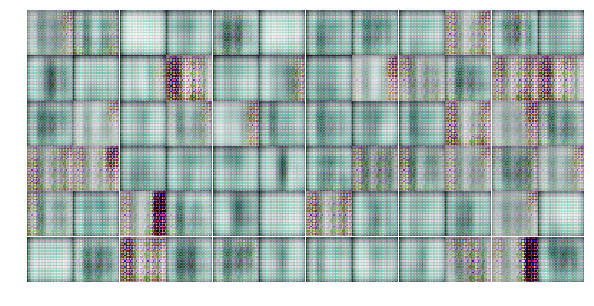

Epoch 1/20... Discriminator Loss: 1.5523... Generator Loss: 1.4453
Epoch 1/20... Discriminator Loss: 0.8464... Generator Loss: 0.8970
Epoch 1/20... Discriminator Loss: 1.0907... Generator Loss: 1.0313
Epoch 1/20... Discriminator Loss: 0.6991... Generator Loss: 1.9489
Epoch 1/20... Discriminator Loss: 1.8347... Generator Loss: 1.3995
Epoch 1/20... Discriminator Loss: 0.8362... Generator Loss: 2.3402
Epoch 1/20... Discriminator Loss: 1.2122... Generator Loss: 3.6150
Epoch 1/20... Discriminator Loss: 0.7611... Generator Loss: 0.9820
Epoch 1/20... Discriminator Loss: 2.4265... Generator Loss: 0.2799
Epoch 1/20... Discriminator Loss: 1.2156... Generator Loss: 1.1000


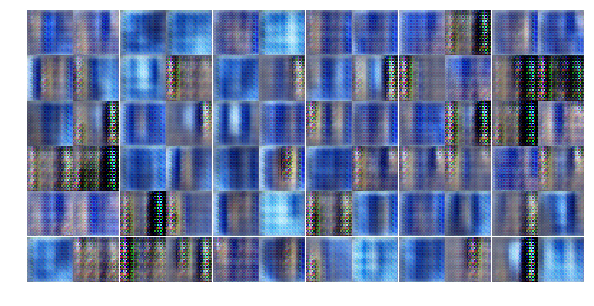

Epoch 1/20... Discriminator Loss: 0.6440... Generator Loss: 1.1711
Epoch 1/20... Discriminator Loss: 0.6832... Generator Loss: 0.9468
Epoch 1/20... Discriminator Loss: 2.4081... Generator Loss: 0.1422
Epoch 1/20... Discriminator Loss: 1.1441... Generator Loss: 0.5040
Epoch 1/20... Discriminator Loss: 0.8153... Generator Loss: 0.9106
Epoch 1/20... Discriminator Loss: 1.9088... Generator Loss: 1.1728
Epoch 1/20... Discriminator Loss: 0.8190... Generator Loss: 0.8598
Epoch 1/20... Discriminator Loss: 3.1962... Generator Loss: 3.8451
Epoch 2/20... Discriminator Loss: 0.8666... Generator Loss: 1.0691
Epoch 2/20... Discriminator Loss: 0.4323... Generator Loss: 1.5807


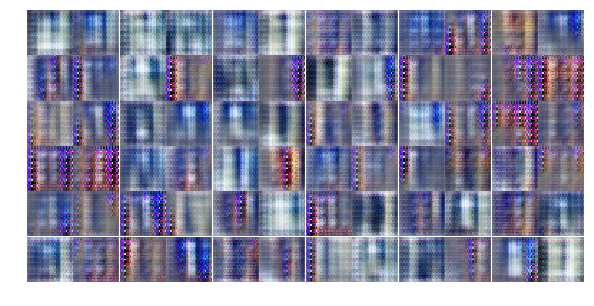

Epoch 2/20... Discriminator Loss: 0.7182... Generator Loss: 1.9854
Epoch 2/20... Discriminator Loss: 1.1366... Generator Loss: 0.9121
Epoch 2/20... Discriminator Loss: 1.3845... Generator Loss: 0.8503
Epoch 2/20... Discriminator Loss: 1.6622... Generator Loss: 0.5102
Epoch 2/20... Discriminator Loss: 1.4626... Generator Loss: 0.3526
Epoch 2/20... Discriminator Loss: 2.2163... Generator Loss: 2.2476
Epoch 2/20... Discriminator Loss: 1.8209... Generator Loss: 0.5124
Epoch 2/20... Discriminator Loss: 1.2311... Generator Loss: 0.8745
Epoch 2/20... Discriminator Loss: 1.4333... Generator Loss: 0.9454
Epoch 2/20... Discriminator Loss: 1.4844... Generator Loss: 0.6936


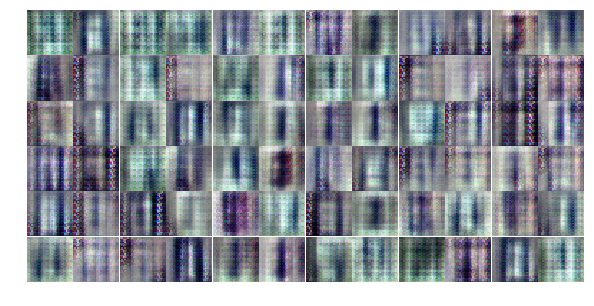

Epoch 2/20... Discriminator Loss: 1.3760... Generator Loss: 0.8055
Epoch 2/20... Discriminator Loss: 1.4423... Generator Loss: 0.9129
Epoch 2/20... Discriminator Loss: 1.4309... Generator Loss: 0.8537
Epoch 2/20... Discriminator Loss: 1.2948... Generator Loss: 1.0146
Epoch 2/20... Discriminator Loss: 1.2879... Generator Loss: 0.6594
Epoch 2/20... Discriminator Loss: 0.4219... Generator Loss: 2.1300
Epoch 2/20... Discriminator Loss: 1.7004... Generator Loss: 0.6461
Epoch 2/20... Discriminator Loss: 1.2680... Generator Loss: 0.6948
Epoch 2/20... Discriminator Loss: 1.2843... Generator Loss: 1.1165
Epoch 2/20... Discriminator Loss: 1.1557... Generator Loss: 0.9676


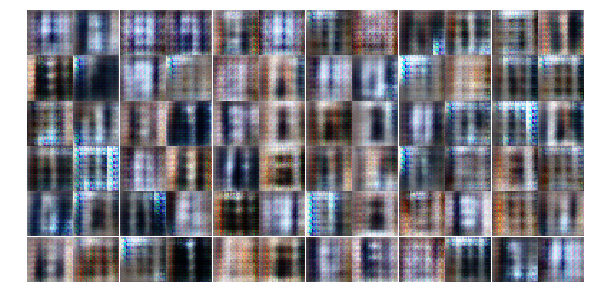

Epoch 2/20... Discriminator Loss: 1.3729... Generator Loss: 0.7179
Epoch 2/20... Discriminator Loss: 1.6950... Generator Loss: 0.7837
Epoch 2/20... Discriminator Loss: 1.4504... Generator Loss: 0.9359
Epoch 2/20... Discriminator Loss: 1.2526... Generator Loss: 0.7039
Epoch 2/20... Discriminator Loss: 1.5776... Generator Loss: 0.3681
Epoch 2/20... Discriminator Loss: 0.8090... Generator Loss: 0.8506
Epoch 2/20... Discriminator Loss: 1.0698... Generator Loss: 0.9843
Epoch 3/20... Discriminator Loss: 1.2359... Generator Loss: 1.6633
Epoch 3/20... Discriminator Loss: 1.2901... Generator Loss: 2.0930
Epoch 3/20... Discriminator Loss: 1.2939... Generator Loss: 0.7120


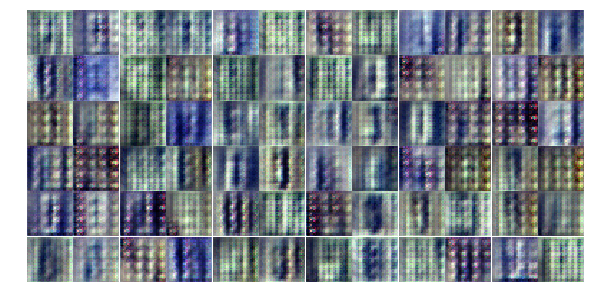

Epoch 3/20... Discriminator Loss: 1.3769... Generator Loss: 0.9088
Epoch 3/20... Discriminator Loss: 1.0371... Generator Loss: 0.7370
Epoch 3/20... Discriminator Loss: 1.3100... Generator Loss: 0.9621
Epoch 3/20... Discriminator Loss: 1.2030... Generator Loss: 0.8332
Epoch 3/20... Discriminator Loss: 1.2419... Generator Loss: 0.5894
Epoch 3/20... Discriminator Loss: 1.3094... Generator Loss: 0.9252
Epoch 3/20... Discriminator Loss: 0.4555... Generator Loss: 2.0705
Epoch 3/20... Discriminator Loss: 1.3446... Generator Loss: 0.7333
Epoch 3/20... Discriminator Loss: 1.4006... Generator Loss: 0.7195
Epoch 3/20... Discriminator Loss: 1.1798... Generator Loss: 0.8298


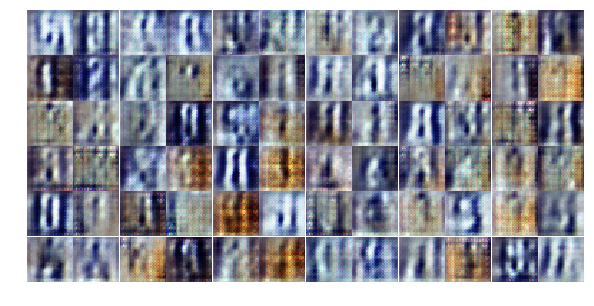

Epoch 3/20... Discriminator Loss: 1.2187... Generator Loss: 1.2273
Epoch 3/20... Discriminator Loss: 1.2462... Generator Loss: 0.9016
Epoch 3/20... Discriminator Loss: 1.2220... Generator Loss: 0.9930
Epoch 3/20... Discriminator Loss: 1.6565... Generator Loss: 1.6260
Epoch 3/20... Discriminator Loss: 1.3982... Generator Loss: 0.7804
Epoch 3/20... Discriminator Loss: 1.2510... Generator Loss: 0.7051
Epoch 3/20... Discriminator Loss: 1.4545... Generator Loss: 0.6794
Epoch 3/20... Discriminator Loss: 1.4022... Generator Loss: 0.6386
Epoch 3/20... Discriminator Loss: 1.3781... Generator Loss: 1.6276
Epoch 3/20... Discriminator Loss: 0.9842... Generator Loss: 1.0921


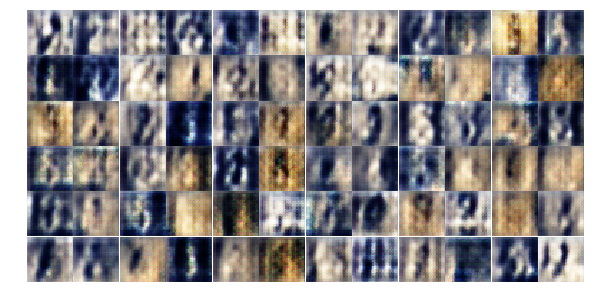

Epoch 3/20... Discriminator Loss: 1.4012... Generator Loss: 1.0903
Epoch 3/20... Discriminator Loss: 1.5808... Generator Loss: 1.0382
Epoch 3/20... Discriminator Loss: 1.2577... Generator Loss: 0.9730
Epoch 3/20... Discriminator Loss: 1.0470... Generator Loss: 1.0207
Epoch 3/20... Discriminator Loss: 1.3360... Generator Loss: 0.6075
Epoch 3/20... Discriminator Loss: 1.0924... Generator Loss: 0.8246
Epoch 4/20... Discriminator Loss: 1.3315... Generator Loss: 0.5328
Epoch 4/20... Discriminator Loss: 1.4157... Generator Loss: 0.6113
Epoch 4/20... Discriminator Loss: 1.1308... Generator Loss: 0.8436
Epoch 4/20... Discriminator Loss: 1.2923... Generator Loss: 0.8097


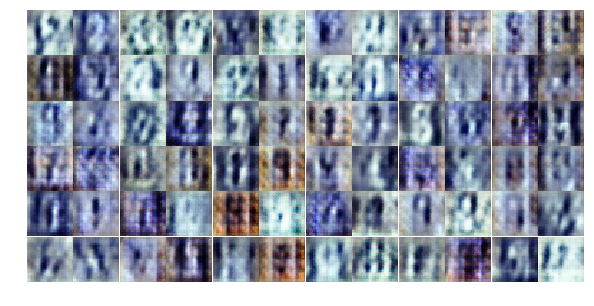

Epoch 4/20... Discriminator Loss: 1.5626... Generator Loss: 0.5907
Epoch 4/20... Discriminator Loss: 1.1831... Generator Loss: 0.7318
Epoch 4/20... Discriminator Loss: 1.2580... Generator Loss: 0.8557
Epoch 4/20... Discriminator Loss: 1.2707... Generator Loss: 0.9709
Epoch 4/20... Discriminator Loss: 1.3280... Generator Loss: 0.9407
Epoch 4/20... Discriminator Loss: 1.0399... Generator Loss: 0.8180
Epoch 4/20... Discriminator Loss: 1.2055... Generator Loss: 0.7814
Epoch 4/20... Discriminator Loss: 1.3664... Generator Loss: 0.8732
Epoch 4/20... Discriminator Loss: 1.1819... Generator Loss: 0.8116
Epoch 4/20... Discriminator Loss: 1.2624... Generator Loss: 0.7671


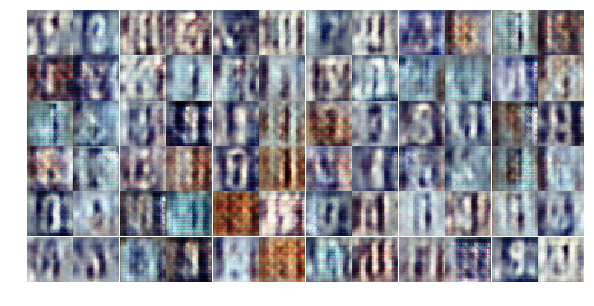

Epoch 4/20... Discriminator Loss: 1.4166... Generator Loss: 1.0592
Epoch 4/20... Discriminator Loss: 1.2757... Generator Loss: 0.6547
Epoch 4/20... Discriminator Loss: 1.4200... Generator Loss: 0.6111
Epoch 4/20... Discriminator Loss: 1.2462... Generator Loss: 1.1008
Epoch 4/20... Discriminator Loss: 1.3571... Generator Loss: 1.0576
Epoch 4/20... Discriminator Loss: 1.3610... Generator Loss: 0.7292
Epoch 4/20... Discriminator Loss: 1.2952... Generator Loss: 0.7805
Epoch 4/20... Discriminator Loss: 1.3087... Generator Loss: 1.7183
Epoch 4/20... Discriminator Loss: 1.2645... Generator Loss: 0.6540
Epoch 4/20... Discriminator Loss: 1.0685... Generator Loss: 0.8757


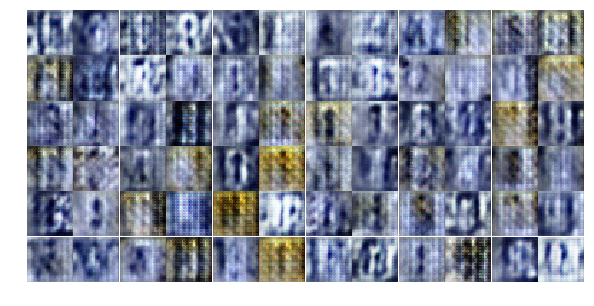

Epoch 4/20... Discriminator Loss: 1.2584... Generator Loss: 1.0950
Epoch 4/20... Discriminator Loss: 1.5407... Generator Loss: 1.3943
Epoch 4/20... Discriminator Loss: 0.9644... Generator Loss: 0.8856
Epoch 4/20... Discriminator Loss: 1.5002... Generator Loss: 0.4359
Epoch 5/20... Discriminator Loss: 1.3198... Generator Loss: 1.0589
Epoch 5/20... Discriminator Loss: 1.3087... Generator Loss: 0.6750
Epoch 5/20... Discriminator Loss: 1.2166... Generator Loss: 0.8274
Epoch 5/20... Discriminator Loss: 1.1373... Generator Loss: 0.8540
Epoch 5/20... Discriminator Loss: 1.2859... Generator Loss: 0.7271
Epoch 5/20... Discriminator Loss: 1.1099... Generator Loss: 1.0567


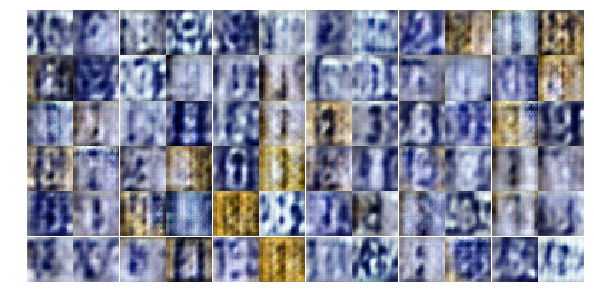

Epoch 5/20... Discriminator Loss: 1.1884... Generator Loss: 0.9716
Epoch 5/20... Discriminator Loss: 1.3275... Generator Loss: 0.7623
Epoch 5/20... Discriminator Loss: 1.1066... Generator Loss: 0.9936
Epoch 5/20... Discriminator Loss: 1.1983... Generator Loss: 0.6395
Epoch 5/20... Discriminator Loss: 1.2547... Generator Loss: 0.8553
Epoch 5/20... Discriminator Loss: 1.4901... Generator Loss: 0.7864
Epoch 5/20... Discriminator Loss: 1.1481... Generator Loss: 0.9056
Epoch 5/20... Discriminator Loss: 1.5449... Generator Loss: 0.5928
Epoch 5/20... Discriminator Loss: 1.4144... Generator Loss: 0.4565
Epoch 5/20... Discriminator Loss: 1.1939... Generator Loss: 0.8127


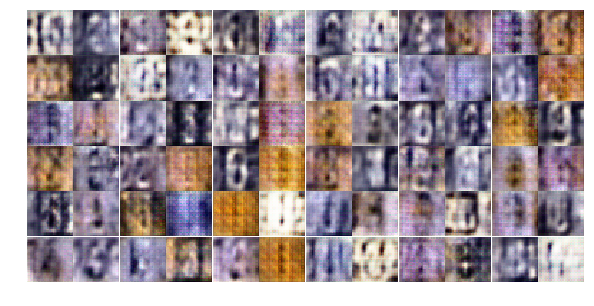

Epoch 5/20... Discriminator Loss: 1.1707... Generator Loss: 0.8349
Epoch 5/20... Discriminator Loss: 1.3995... Generator Loss: 1.2688
Epoch 5/20... Discriminator Loss: 1.1978... Generator Loss: 1.2620
Epoch 5/20... Discriminator Loss: 1.1414... Generator Loss: 0.7915
Epoch 5/20... Discriminator Loss: 1.2091... Generator Loss: 1.3025
Epoch 5/20... Discriminator Loss: 1.1071... Generator Loss: 1.3346
Epoch 5/20... Discriminator Loss: 1.2661... Generator Loss: 0.9364
Epoch 5/20... Discriminator Loss: 1.1661... Generator Loss: 0.8398
Epoch 5/20... Discriminator Loss: 0.9831... Generator Loss: 1.2135
Epoch 5/20... Discriminator Loss: 1.1642... Generator Loss: 0.7226


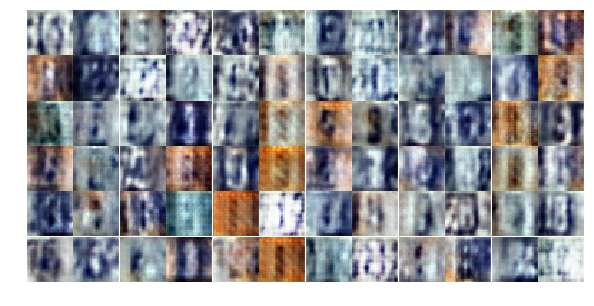

Epoch 5/20... Discriminator Loss: 1.5105... Generator Loss: 0.3622
Epoch 5/20... Discriminator Loss: 1.1212... Generator Loss: 0.8594
Epoch 5/20... Discriminator Loss: 1.5350... Generator Loss: 1.7531
Epoch 6/20... Discriminator Loss: 1.1312... Generator Loss: 0.7927
Epoch 6/20... Discriminator Loss: 1.0285... Generator Loss: 0.9444
Epoch 6/20... Discriminator Loss: 1.1795... Generator Loss: 0.8298
Epoch 6/20... Discriminator Loss: 1.2748... Generator Loss: 0.7120
Epoch 6/20... Discriminator Loss: 1.0352... Generator Loss: 0.9213
Epoch 6/20... Discriminator Loss: 1.4180... Generator Loss: 0.4452
Epoch 6/20... Discriminator Loss: 1.2075... Generator Loss: 1.4345


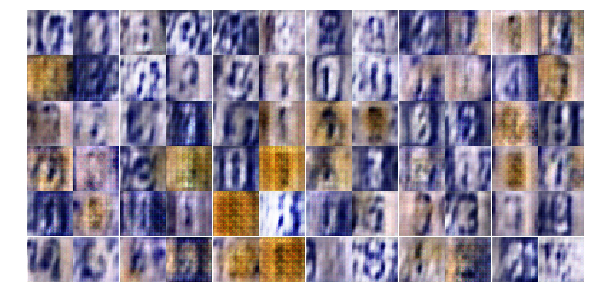

Epoch 6/20... Discriminator Loss: 0.9493... Generator Loss: 1.2772
Epoch 6/20... Discriminator Loss: 1.3931... Generator Loss: 0.4552
Epoch 6/20... Discriminator Loss: 0.8568... Generator Loss: 1.0591
Epoch 6/20... Discriminator Loss: 1.0783... Generator Loss: 0.7023
Epoch 6/20... Discriminator Loss: 0.9289... Generator Loss: 2.4937
Epoch 6/20... Discriminator Loss: 1.0778... Generator Loss: 0.6173
Epoch 6/20... Discriminator Loss: 1.8493... Generator Loss: 2.3400
Epoch 6/20... Discriminator Loss: 1.0946... Generator Loss: 0.8443
Epoch 6/20... Discriminator Loss: 1.3402... Generator Loss: 1.0546
Epoch 6/20... Discriminator Loss: 1.1020... Generator Loss: 0.9388


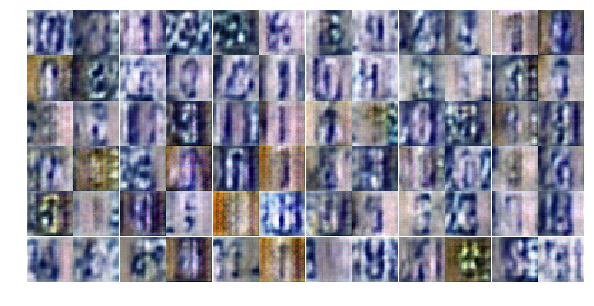

Epoch 6/20... Discriminator Loss: 1.6248... Generator Loss: 2.3555
Epoch 6/20... Discriminator Loss: 1.1049... Generator Loss: 0.9873
Epoch 6/20... Discriminator Loss: 1.0925... Generator Loss: 0.9012
Epoch 6/20... Discriminator Loss: 0.9963... Generator Loss: 1.1129
Epoch 6/20... Discriminator Loss: 1.1817... Generator Loss: 0.5731
Epoch 6/20... Discriminator Loss: 1.3022... Generator Loss: 1.1609
Epoch 6/20... Discriminator Loss: 1.0765... Generator Loss: 0.8600
Epoch 6/20... Discriminator Loss: 1.1354... Generator Loss: 0.8107
Epoch 6/20... Discriminator Loss: 1.2309... Generator Loss: 1.1230
Epoch 6/20... Discriminator Loss: 1.5234... Generator Loss: 0.3846


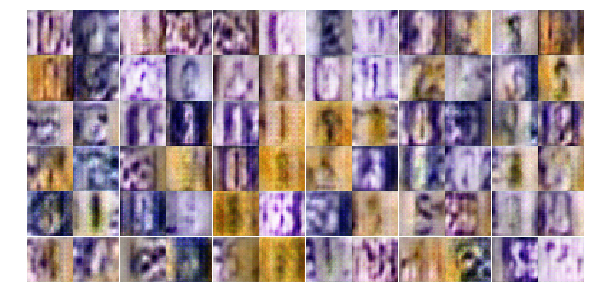

Epoch 6/20... Discriminator Loss: 1.2178... Generator Loss: 0.6948
Epoch 6/20... Discriminator Loss: 1.4714... Generator Loss: 0.5442
Epoch 7/20... Discriminator Loss: 1.1237... Generator Loss: 0.8652
Epoch 7/20... Discriminator Loss: 1.2615... Generator Loss: 1.0718
Epoch 7/20... Discriminator Loss: 1.0990... Generator Loss: 1.2365
Epoch 7/20... Discriminator Loss: 1.5792... Generator Loss: 0.3862
Epoch 7/20... Discriminator Loss: 1.1338... Generator Loss: 0.8557
Epoch 7/20... Discriminator Loss: 1.1486... Generator Loss: 0.7726
Epoch 7/20... Discriminator Loss: 1.3069... Generator Loss: 0.5126
Epoch 7/20... Discriminator Loss: 1.2995... Generator Loss: 0.5239


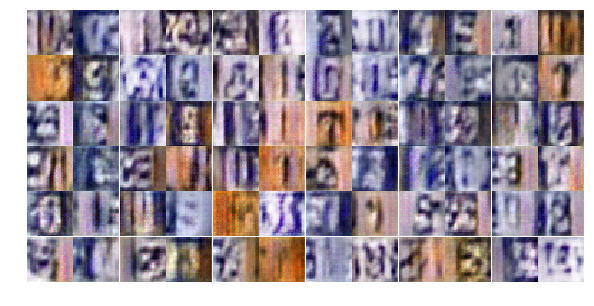

Epoch 7/20... Discriminator Loss: 1.7613... Generator Loss: 0.2615
Epoch 7/20... Discriminator Loss: 1.1092... Generator Loss: 1.4068
Epoch 7/20... Discriminator Loss: 1.2584... Generator Loss: 0.6609
Epoch 7/20... Discriminator Loss: 1.0891... Generator Loss: 1.0537
Epoch 7/20... Discriminator Loss: 1.4611... Generator Loss: 1.7854
Epoch 7/20... Discriminator Loss: 1.2901... Generator Loss: 0.7632
Epoch 7/20... Discriminator Loss: 1.3238... Generator Loss: 1.1180
Epoch 7/20... Discriminator Loss: 0.9809... Generator Loss: 1.0396
Epoch 7/20... Discriminator Loss: 1.1575... Generator Loss: 1.1974
Epoch 7/20... Discriminator Loss: 1.3635... Generator Loss: 0.5369


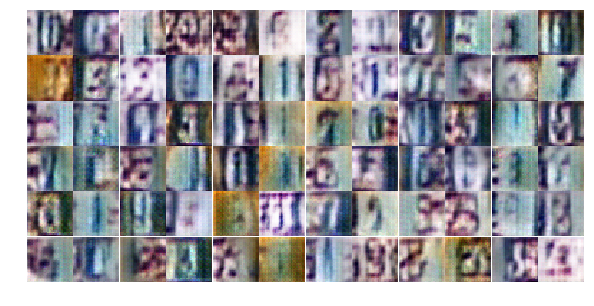

Epoch 7/20... Discriminator Loss: 1.2570... Generator Loss: 0.9544
Epoch 7/20... Discriminator Loss: 1.2168... Generator Loss: 0.5808
Epoch 7/20... Discriminator Loss: 1.4739... Generator Loss: 1.1595
Epoch 7/20... Discriminator Loss: 1.3218... Generator Loss: 0.6050
Epoch 7/20... Discriminator Loss: 1.2180... Generator Loss: 0.8673
Epoch 7/20... Discriminator Loss: 1.1206... Generator Loss: 0.9944
Epoch 7/20... Discriminator Loss: 1.2017... Generator Loss: 0.6994
Epoch 7/20... Discriminator Loss: 1.7547... Generator Loss: 0.2730
Epoch 7/20... Discriminator Loss: 1.6099... Generator Loss: 0.4273
Epoch 7/20... Discriminator Loss: 1.3421... Generator Loss: 0.8444


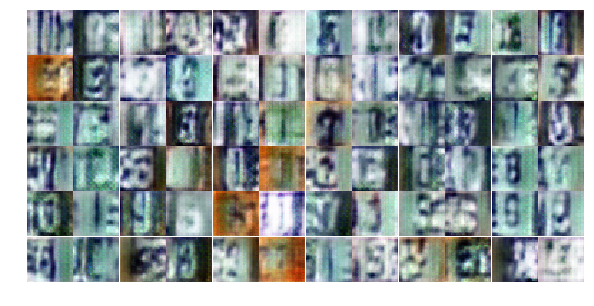

Epoch 8/20... Discriminator Loss: 0.9966... Generator Loss: 1.0296
Epoch 8/20... Discriminator Loss: 1.0861... Generator Loss: 1.2494
Epoch 8/20... Discriminator Loss: 1.2033... Generator Loss: 0.8860
Epoch 8/20... Discriminator Loss: 1.2136... Generator Loss: 0.7739
Epoch 8/20... Discriminator Loss: 1.2302... Generator Loss: 0.5469
Epoch 8/20... Discriminator Loss: 1.0734... Generator Loss: 0.7847
Epoch 8/20... Discriminator Loss: 1.0912... Generator Loss: 1.0291
Epoch 8/20... Discriminator Loss: 1.2217... Generator Loss: 0.5851
Epoch 8/20... Discriminator Loss: 1.5246... Generator Loss: 2.4508
Epoch 8/20... Discriminator Loss: 1.0537... Generator Loss: 0.8350


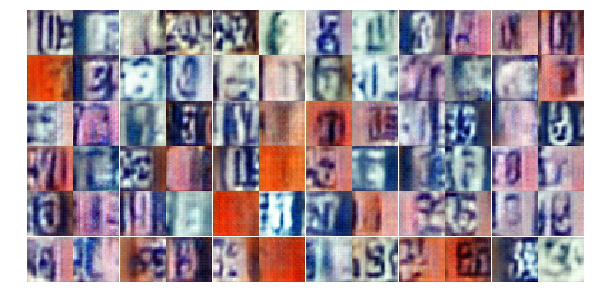

Epoch 8/20... Discriminator Loss: 1.0264... Generator Loss: 0.8047
Epoch 8/20... Discriminator Loss: 1.0739... Generator Loss: 0.8486
Epoch 8/20... Discriminator Loss: 1.3271... Generator Loss: 0.6222
Epoch 8/20... Discriminator Loss: 1.1784... Generator Loss: 0.9842
Epoch 8/20... Discriminator Loss: 0.9829... Generator Loss: 1.1216
Epoch 8/20... Discriminator Loss: 1.4328... Generator Loss: 0.5283
Epoch 8/20... Discriminator Loss: 1.4471... Generator Loss: 0.4017
Epoch 8/20... Discriminator Loss: 1.2551... Generator Loss: 0.6524
Epoch 8/20... Discriminator Loss: 1.1897... Generator Loss: 0.5744
Epoch 8/20... Discriminator Loss: 1.0989... Generator Loss: 0.8738


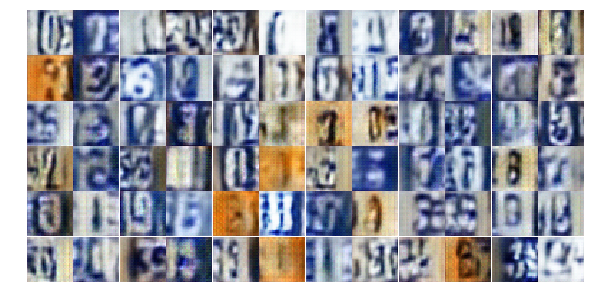

Epoch 8/20... Discriminator Loss: 1.1317... Generator Loss: 1.0618
Epoch 8/20... Discriminator Loss: 1.2512... Generator Loss: 0.9898
Epoch 8/20... Discriminator Loss: 1.1636... Generator Loss: 0.9011
Epoch 8/20... Discriminator Loss: 1.4815... Generator Loss: 0.4123
Epoch 8/20... Discriminator Loss: 1.0921... Generator Loss: 0.8599
Epoch 8/20... Discriminator Loss: 1.1419... Generator Loss: 0.8177
Epoch 8/20... Discriminator Loss: 1.2050... Generator Loss: 1.0772
Epoch 8/20... Discriminator Loss: 1.2187... Generator Loss: 0.5757
Epoch 8/20... Discriminator Loss: 1.1935... Generator Loss: 0.7137
Epoch 9/20... Discriminator Loss: 1.3405... Generator Loss: 1.2414


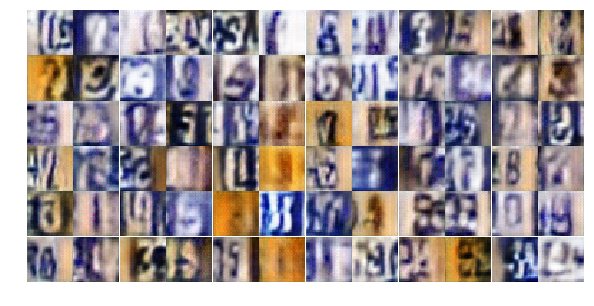

Epoch 9/20... Discriminator Loss: 1.1701... Generator Loss: 0.7007
Epoch 9/20... Discriminator Loss: 1.3400... Generator Loss: 0.5027
Epoch 9/20... Discriminator Loss: 1.3316... Generator Loss: 0.8302
Epoch 9/20... Discriminator Loss: 1.4017... Generator Loss: 0.7303
Epoch 9/20... Discriminator Loss: 1.1365... Generator Loss: 0.6716
Epoch 9/20... Discriminator Loss: 1.0189... Generator Loss: 1.1213
Epoch 9/20... Discriminator Loss: 1.1609... Generator Loss: 1.3289
Epoch 9/20... Discriminator Loss: 1.1371... Generator Loss: 1.0693
Epoch 9/20... Discriminator Loss: 1.7256... Generator Loss: 0.2723
Epoch 9/20... Discriminator Loss: 1.0522... Generator Loss: 1.2416


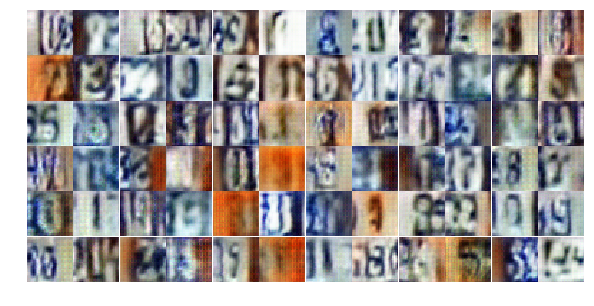

Epoch 9/20... Discriminator Loss: 1.1272... Generator Loss: 1.3446
Epoch 9/20... Discriminator Loss: 0.9904... Generator Loss: 0.8880
Epoch 9/20... Discriminator Loss: 1.5374... Generator Loss: 0.3330
Epoch 9/20... Discriminator Loss: 1.0121... Generator Loss: 0.9007
Epoch 9/20... Discriminator Loss: 0.9442... Generator Loss: 1.1844
Epoch 9/20... Discriminator Loss: 1.2077... Generator Loss: 1.6020
Epoch 9/20... Discriminator Loss: 1.0554... Generator Loss: 1.6749
Epoch 9/20... Discriminator Loss: 1.4284... Generator Loss: 1.5596
Epoch 9/20... Discriminator Loss: 1.1451... Generator Loss: 1.3999
Epoch 9/20... Discriminator Loss: 1.3523... Generator Loss: 0.8685


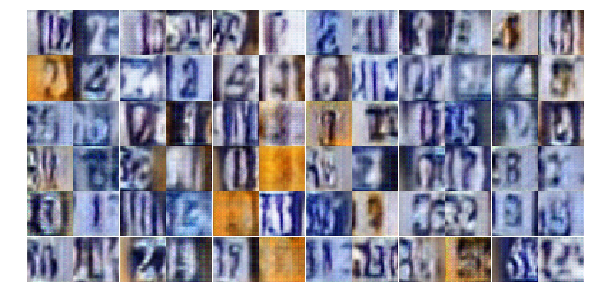

Epoch 9/20... Discriminator Loss: 1.1259... Generator Loss: 1.4008
Epoch 9/20... Discriminator Loss: 1.1192... Generator Loss: 0.7200
Epoch 9/20... Discriminator Loss: 1.1676... Generator Loss: 0.6945
Epoch 9/20... Discriminator Loss: 1.2420... Generator Loss: 0.7624
Epoch 9/20... Discriminator Loss: 0.9011... Generator Loss: 1.2618
Epoch 9/20... Discriminator Loss: 1.1810... Generator Loss: 2.1840
Epoch 9/20... Discriminator Loss: 1.1477... Generator Loss: 1.0984
Epoch 9/20... Discriminator Loss: 0.9463... Generator Loss: 0.8972
Epoch 10/20... Discriminator Loss: 1.0922... Generator Loss: 0.8096
Epoch 10/20... Discriminator Loss: 1.4416... Generator Loss: 0.4396


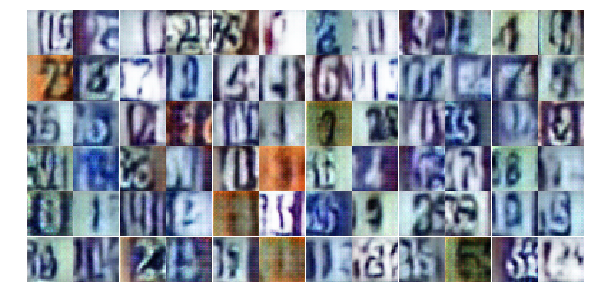

Epoch 10/20... Discriminator Loss: 1.2826... Generator Loss: 0.5644
Epoch 10/20... Discriminator Loss: 0.9671... Generator Loss: 1.5038
Epoch 10/20... Discriminator Loss: 1.0434... Generator Loss: 1.0516
Epoch 10/20... Discriminator Loss: 1.2356... Generator Loss: 0.5674
Epoch 10/20... Discriminator Loss: 1.1223... Generator Loss: 1.2910
Epoch 10/20... Discriminator Loss: 1.3688... Generator Loss: 1.1975
Epoch 10/20... Discriminator Loss: 0.9878... Generator Loss: 1.0054
Epoch 10/20... Discriminator Loss: 0.8265... Generator Loss: 1.3870
Epoch 10/20... Discriminator Loss: 1.1656... Generator Loss: 0.8851
Epoch 10/20... Discriminator Loss: 1.2317... Generator Loss: 0.7437


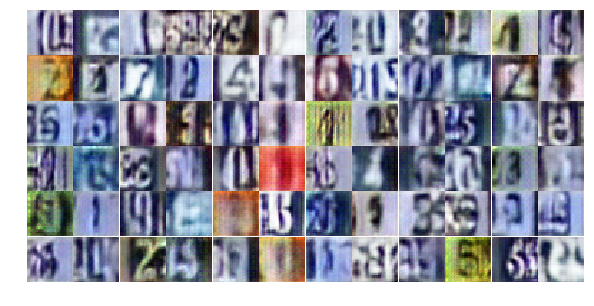

Epoch 10/20... Discriminator Loss: 1.2234... Generator Loss: 0.6433
Epoch 10/20... Discriminator Loss: 1.0011... Generator Loss: 1.1320
Epoch 10/20... Discriminator Loss: 1.4302... Generator Loss: 0.4283
Epoch 10/20... Discriminator Loss: 0.9700... Generator Loss: 0.8574
Epoch 10/20... Discriminator Loss: 1.2940... Generator Loss: 0.6531
Epoch 10/20... Discriminator Loss: 1.2298... Generator Loss: 1.0329
Epoch 10/20... Discriminator Loss: 1.4219... Generator Loss: 0.8439
Epoch 10/20... Discriminator Loss: 0.8120... Generator Loss: 1.4705
Epoch 10/20... Discriminator Loss: 1.2557... Generator Loss: 0.5516
Epoch 10/20... Discriminator Loss: 1.0058... Generator Loss: 0.8565


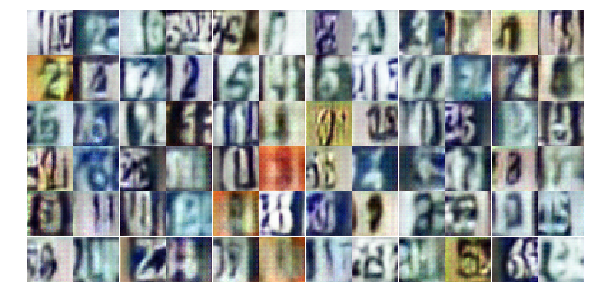

Epoch 10/20... Discriminator Loss: 1.1527... Generator Loss: 0.8521
Epoch 10/20... Discriminator Loss: 1.0471... Generator Loss: 0.9171
Epoch 10/20... Discriminator Loss: 0.9527... Generator Loss: 1.1692
Epoch 10/20... Discriminator Loss: 1.3347... Generator Loss: 1.0910
Epoch 10/20... Discriminator Loss: 0.9761... Generator Loss: 1.0004
Epoch 10/20... Discriminator Loss: 1.1416... Generator Loss: 2.0065
Epoch 10/20... Discriminator Loss: 0.9808... Generator Loss: 1.0854
Epoch 11/20... Discriminator Loss: 1.3174... Generator Loss: 1.0626
Epoch 11/20... Discriminator Loss: 1.2124... Generator Loss: 0.8383
Epoch 11/20... Discriminator Loss: 1.0789... Generator Loss: 0.9178


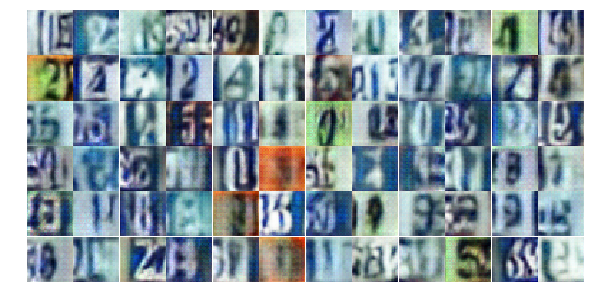

Epoch 11/20... Discriminator Loss: 1.1141... Generator Loss: 0.6910
Epoch 11/20... Discriminator Loss: 1.1296... Generator Loss: 0.9906
Epoch 11/20... Discriminator Loss: 1.4474... Generator Loss: 0.7286
Epoch 11/20... Discriminator Loss: 1.3502... Generator Loss: 0.4930
Epoch 11/20... Discriminator Loss: 1.0476... Generator Loss: 0.7557
Epoch 11/20... Discriminator Loss: 1.2514... Generator Loss: 0.6472
Epoch 11/20... Discriminator Loss: 1.2970... Generator Loss: 1.0800
Epoch 11/20... Discriminator Loss: 1.0567... Generator Loss: 0.6792
Epoch 11/20... Discriminator Loss: 1.0525... Generator Loss: 1.0030
Epoch 11/20... Discriminator Loss: 1.3033... Generator Loss: 0.4850


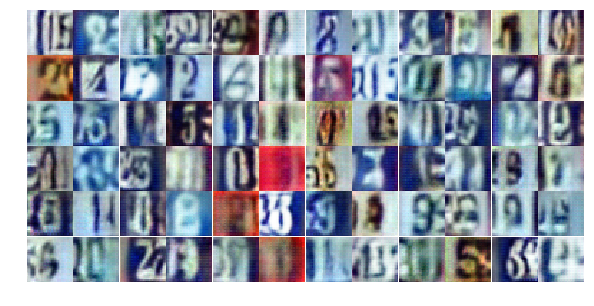

Epoch 11/20... Discriminator Loss: 1.6518... Generator Loss: 0.3112
Epoch 11/20... Discriminator Loss: 1.3852... Generator Loss: 0.6777
Epoch 11/20... Discriminator Loss: 1.1023... Generator Loss: 1.0711
Epoch 11/20... Discriminator Loss: 1.1185... Generator Loss: 1.1636
Epoch 11/20... Discriminator Loss: 0.8547... Generator Loss: 1.1971
Epoch 11/20... Discriminator Loss: 1.0703... Generator Loss: 0.9090
Epoch 11/20... Discriminator Loss: 1.0778... Generator Loss: 0.7350
Epoch 11/20... Discriminator Loss: 1.1676... Generator Loss: 0.6643
Epoch 11/20... Discriminator Loss: 1.0363... Generator Loss: 1.7231
Epoch 11/20... Discriminator Loss: 1.2773... Generator Loss: 0.6096


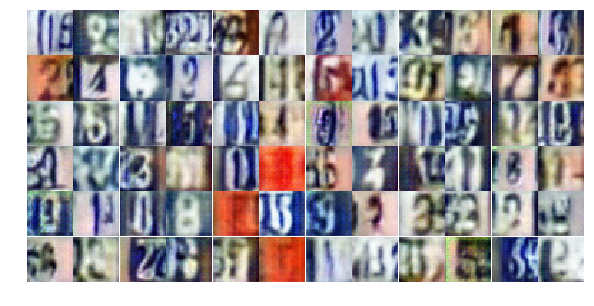

Epoch 11/20... Discriminator Loss: 0.9688... Generator Loss: 1.5120
Epoch 11/20... Discriminator Loss: 1.2156... Generator Loss: 0.8851
Epoch 11/20... Discriminator Loss: 1.4924... Generator Loss: 0.3615
Epoch 11/20... Discriminator Loss: 1.1183... Generator Loss: 1.0900
Epoch 11/20... Discriminator Loss: 1.1580... Generator Loss: 0.9091
Epoch 12/20... Discriminator Loss: 1.6581... Generator Loss: 0.3756
Epoch 12/20... Discriminator Loss: 0.8471... Generator Loss: 1.1875
Epoch 12/20... Discriminator Loss: 1.0064... Generator Loss: 1.4215
Epoch 12/20... Discriminator Loss: 1.3085... Generator Loss: 0.7057
Epoch 12/20... Discriminator Loss: 0.8114... Generator Loss: 1.1719


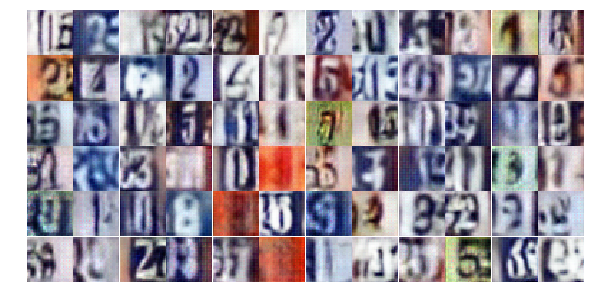

Epoch 12/20... Discriminator Loss: 1.2524... Generator Loss: 0.7009
Epoch 12/20... Discriminator Loss: 1.1141... Generator Loss: 0.7003
Epoch 12/20... Discriminator Loss: 1.2346... Generator Loss: 0.5020
Epoch 12/20... Discriminator Loss: 1.0910... Generator Loss: 0.7253
Epoch 12/20... Discriminator Loss: 1.0434... Generator Loss: 0.6731
Epoch 12/20... Discriminator Loss: 1.2799... Generator Loss: 1.1576
Epoch 12/20... Discriminator Loss: 1.1523... Generator Loss: 1.1289
Epoch 12/20... Discriminator Loss: 1.0087... Generator Loss: 0.7558
Epoch 12/20... Discriminator Loss: 1.0708... Generator Loss: 0.8530
Epoch 12/20... Discriminator Loss: 1.1301... Generator Loss: 2.3726


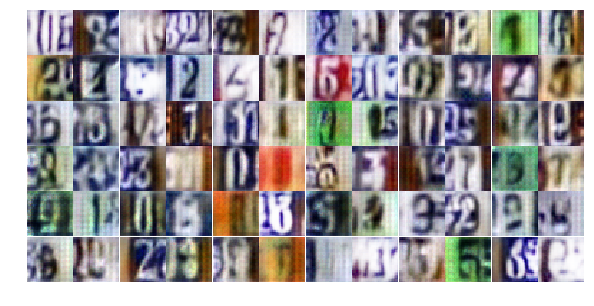

Epoch 12/20... Discriminator Loss: 0.9121... Generator Loss: 1.5165
Epoch 12/20... Discriminator Loss: 1.0381... Generator Loss: 1.0114
Epoch 12/20... Discriminator Loss: 1.6931... Generator Loss: 1.3472
Epoch 12/20... Discriminator Loss: 0.6878... Generator Loss: 1.8179
Epoch 12/20... Discriminator Loss: 0.5811... Generator Loss: 1.7793
Epoch 12/20... Discriminator Loss: 0.8352... Generator Loss: 0.9222
Epoch 12/20... Discriminator Loss: 1.2916... Generator Loss: 0.4444
Epoch 12/20... Discriminator Loss: 1.5065... Generator Loss: 0.3660
Epoch 12/20... Discriminator Loss: 1.0543... Generator Loss: 0.7325
Epoch 12/20... Discriminator Loss: 1.6275... Generator Loss: 0.2908


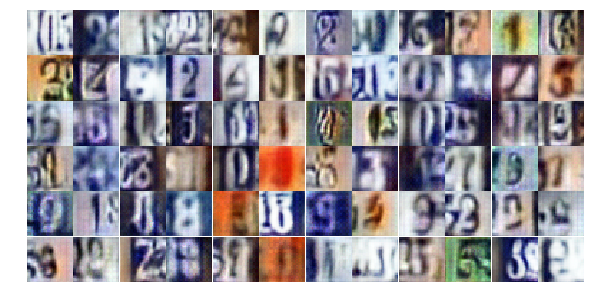

Epoch 12/20... Discriminator Loss: 1.1356... Generator Loss: 1.1765
Epoch 12/20... Discriminator Loss: 0.9452... Generator Loss: 1.0295
Epoch 12/20... Discriminator Loss: 1.1708... Generator Loss: 0.5279
Epoch 12/20... Discriminator Loss: 1.0688... Generator Loss: 1.0640
Epoch 13/20... Discriminator Loss: 0.9780... Generator Loss: 1.1812
Epoch 13/20... Discriminator Loss: 1.5781... Generator Loss: 0.3354
Epoch 13/20... Discriminator Loss: 1.1900... Generator Loss: 1.0960
Epoch 13/20... Discriminator Loss: 0.8664... Generator Loss: 1.1411
Epoch 13/20... Discriminator Loss: 1.0792... Generator Loss: 1.0898
Epoch 13/20... Discriminator Loss: 1.0244... Generator Loss: 0.6840


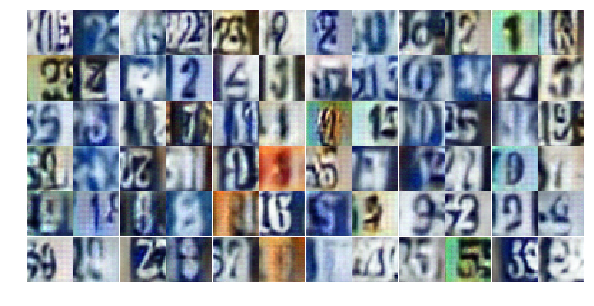

Epoch 13/20... Discriminator Loss: 1.6545... Generator Loss: 0.3605
Epoch 13/20... Discriminator Loss: 1.2986... Generator Loss: 0.4547
Epoch 13/20... Discriminator Loss: 1.3662... Generator Loss: 0.5040
Epoch 13/20... Discriminator Loss: 0.8493... Generator Loss: 1.7143
Epoch 13/20... Discriminator Loss: 0.8485... Generator Loss: 1.6561
Epoch 13/20... Discriminator Loss: 0.7916... Generator Loss: 2.0704
Epoch 13/20... Discriminator Loss: 1.2771... Generator Loss: 0.6230
Epoch 13/20... Discriminator Loss: 1.9327... Generator Loss: 0.2395
Epoch 13/20... Discriminator Loss: 0.6302... Generator Loss: 1.1403
Epoch 13/20... Discriminator Loss: 1.1689... Generator Loss: 0.6985


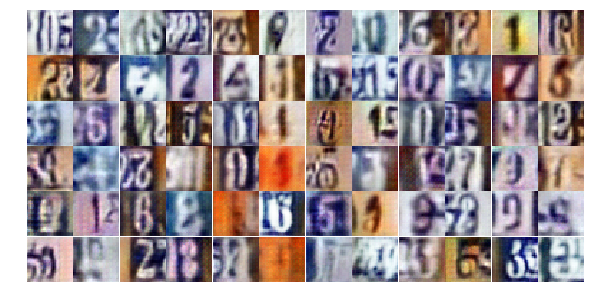

Epoch 13/20... Discriminator Loss: 0.4972... Generator Loss: 1.4093
Epoch 13/20... Discriminator Loss: 1.3400... Generator Loss: 0.4278
Epoch 13/20... Discriminator Loss: 1.1175... Generator Loss: 0.6173
Epoch 13/20... Discriminator Loss: 0.7922... Generator Loss: 1.2387
Epoch 13/20... Discriminator Loss: 0.9269... Generator Loss: 0.8114
Epoch 13/20... Discriminator Loss: 1.1351... Generator Loss: 0.9352
Epoch 13/20... Discriminator Loss: 1.1270... Generator Loss: 0.8948
Epoch 13/20... Discriminator Loss: 0.8571... Generator Loss: 0.8709
Epoch 13/20... Discriminator Loss: 1.2177... Generator Loss: 0.5402
Epoch 13/20... Discriminator Loss: 0.8625... Generator Loss: 2.2494


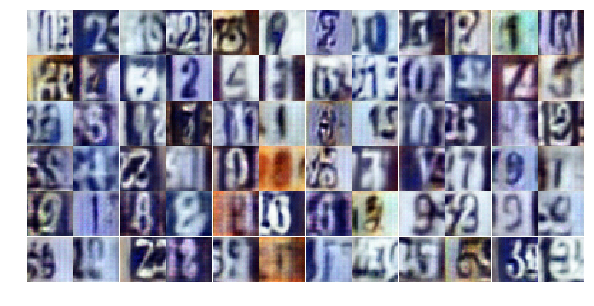

Epoch 13/20... Discriminator Loss: 1.5781... Generator Loss: 0.4175
Epoch 13/20... Discriminator Loss: 0.5763... Generator Loss: 1.5681
Epoch 13/20... Discriminator Loss: 1.0872... Generator Loss: 0.8178
Epoch 14/20... Discriminator Loss: 0.7997... Generator Loss: 1.1053
Epoch 14/20... Discriminator Loss: 2.1689... Generator Loss: 2.4174
Epoch 14/20... Discriminator Loss: 0.7199... Generator Loss: 1.5273
Epoch 14/20... Discriminator Loss: 0.8157... Generator Loss: 1.8626
Epoch 14/20... Discriminator Loss: 1.4689... Generator Loss: 0.4682
Epoch 14/20... Discriminator Loss: 0.9895... Generator Loss: 1.0783
Epoch 14/20... Discriminator Loss: 0.7486... Generator Loss: 1.3612


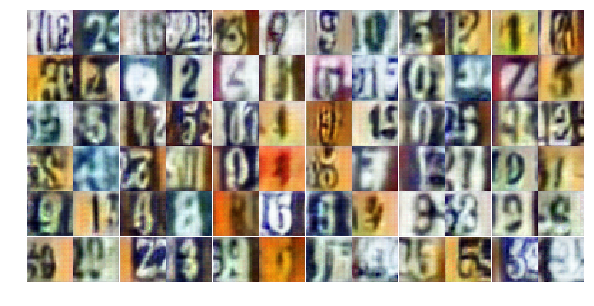

Epoch 14/20... Discriminator Loss: 0.8188... Generator Loss: 1.8077
Epoch 14/20... Discriminator Loss: 1.1296... Generator Loss: 0.6638
Epoch 14/20... Discriminator Loss: 1.2253... Generator Loss: 0.5261
Epoch 14/20... Discriminator Loss: 0.4095... Generator Loss: 1.8476
Epoch 14/20... Discriminator Loss: 0.5509... Generator Loss: 1.2892
Epoch 14/20... Discriminator Loss: 0.8089... Generator Loss: 2.5786
Epoch 14/20... Discriminator Loss: 1.2503... Generator Loss: 1.1444
Epoch 14/20... Discriminator Loss: 0.9126... Generator Loss: 1.0797
Epoch 14/20... Discriminator Loss: 0.6884... Generator Loss: 2.5070
Epoch 14/20... Discriminator Loss: 0.8170... Generator Loss: 2.2657


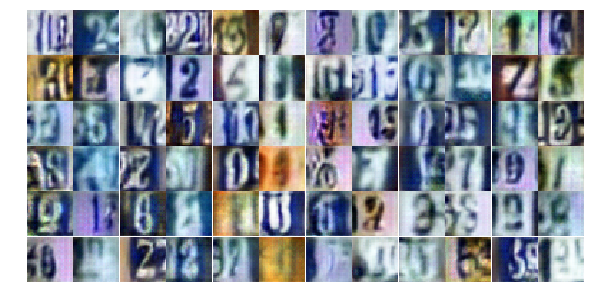

Epoch 14/20... Discriminator Loss: 1.4398... Generator Loss: 1.1604
Epoch 14/20... Discriminator Loss: 0.9886... Generator Loss: 1.2688
Epoch 14/20... Discriminator Loss: 0.8790... Generator Loss: 1.0556
Epoch 14/20... Discriminator Loss: 0.6454... Generator Loss: 1.2817
Epoch 14/20... Discriminator Loss: 1.5044... Generator Loss: 0.4268
Epoch 14/20... Discriminator Loss: 1.0095... Generator Loss: 1.6597
Epoch 14/20... Discriminator Loss: 1.2096... Generator Loss: 0.6224
Epoch 14/20... Discriminator Loss: 1.0316... Generator Loss: 0.9874
Epoch 14/20... Discriminator Loss: 1.6348... Generator Loss: 0.9778
Epoch 14/20... Discriminator Loss: 1.3407... Generator Loss: 2.0568


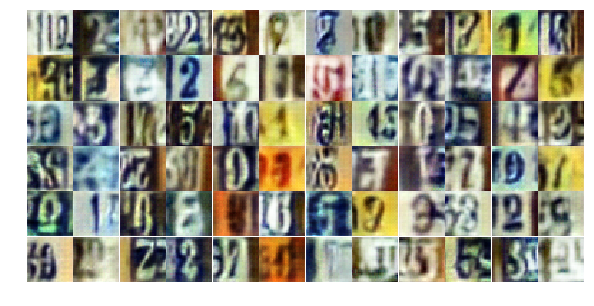

Epoch 14/20... Discriminator Loss: 1.0090... Generator Loss: 1.3294
Epoch 15/20... Discriminator Loss: 1.1364... Generator Loss: 0.9924
Epoch 15/20... Discriminator Loss: 1.2983... Generator Loss: 0.4442
Epoch 15/20... Discriminator Loss: 1.2012... Generator Loss: 0.7873
Epoch 15/20... Discriminator Loss: 0.6382... Generator Loss: 1.1867
Epoch 15/20... Discriminator Loss: 1.5609... Generator Loss: 0.3605
Epoch 15/20... Discriminator Loss: 1.2803... Generator Loss: 0.4654
Epoch 15/20... Discriminator Loss: 0.6022... Generator Loss: 1.6075
Epoch 15/20... Discriminator Loss: 1.9816... Generator Loss: 2.5061
Epoch 15/20... Discriminator Loss: 1.2116... Generator Loss: 0.8131


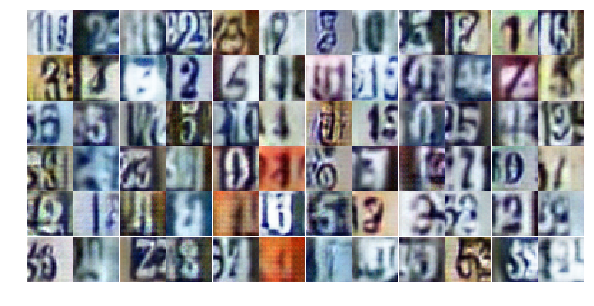

Epoch 15/20... Discriminator Loss: 0.6407... Generator Loss: 1.0910
Epoch 15/20... Discriminator Loss: 0.9448... Generator Loss: 0.6879
Epoch 15/20... Discriminator Loss: 2.0514... Generator Loss: 0.2363
Epoch 15/20... Discriminator Loss: 0.7021... Generator Loss: 1.2528
Epoch 15/20... Discriminator Loss: 0.6120... Generator Loss: 1.2898
Epoch 15/20... Discriminator Loss: 0.7392... Generator Loss: 0.9657
Epoch 15/20... Discriminator Loss: 1.3517... Generator Loss: 0.6498
Epoch 15/20... Discriminator Loss: 0.7276... Generator Loss: 1.5792
Epoch 15/20... Discriminator Loss: 1.1437... Generator Loss: 1.5797
Epoch 15/20... Discriminator Loss: 0.4058... Generator Loss: 2.1084


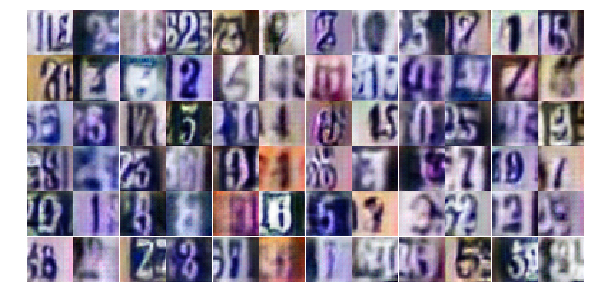

Epoch 15/20... Discriminator Loss: 1.0187... Generator Loss: 1.2456
Epoch 15/20... Discriminator Loss: 0.9749... Generator Loss: 1.2724
Epoch 15/20... Discriminator Loss: 0.9912... Generator Loss: 2.0473
Epoch 15/20... Discriminator Loss: 0.8962... Generator Loss: 1.1722
Epoch 15/20... Discriminator Loss: 1.3945... Generator Loss: 2.3032
Epoch 15/20... Discriminator Loss: 0.7801... Generator Loss: 1.2562
Epoch 15/20... Discriminator Loss: 0.9402... Generator Loss: 1.3036
Epoch 15/20... Discriminator Loss: 0.3845... Generator Loss: 1.9716
Epoch 15/20... Discriminator Loss: 1.3281... Generator Loss: 0.4309
Epoch 15/20... Discriminator Loss: 1.0836... Generator Loss: 0.7307


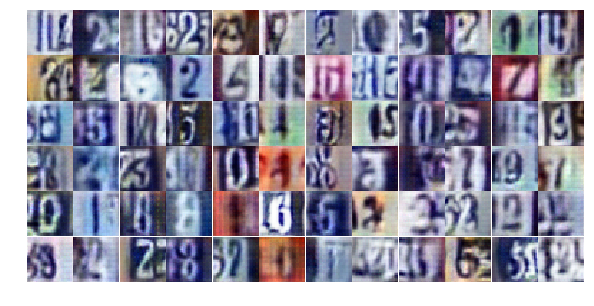

Epoch 16/20... Discriminator Loss: 1.7543... Generator Loss: 0.2980
Epoch 16/20... Discriminator Loss: 1.2830... Generator Loss: 0.5750
Epoch 16/20... Discriminator Loss: 1.3437... Generator Loss: 0.4475
Epoch 16/20... Discriminator Loss: 0.7488... Generator Loss: 1.0667
Epoch 16/20... Discriminator Loss: 0.9751... Generator Loss: 0.6458
Epoch 16/20... Discriminator Loss: 0.8964... Generator Loss: 1.3892
Epoch 16/20... Discriminator Loss: 0.8228... Generator Loss: 1.5257
Epoch 16/20... Discriminator Loss: 1.2852... Generator Loss: 0.7493
Epoch 16/20... Discriminator Loss: 1.2042... Generator Loss: 0.8944
Epoch 16/20... Discriminator Loss: 0.6977... Generator Loss: 1.1914


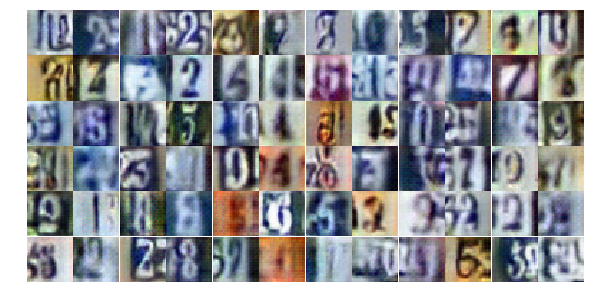

Epoch 16/20... Discriminator Loss: 0.8192... Generator Loss: 0.8659
Epoch 16/20... Discriminator Loss: 0.9505... Generator Loss: 1.5729
Epoch 16/20... Discriminator Loss: 1.4756... Generator Loss: 0.5752
Epoch 16/20... Discriminator Loss: 0.5212... Generator Loss: 1.2456
Epoch 16/20... Discriminator Loss: 1.5240... Generator Loss: 0.8182
Epoch 16/20... Discriminator Loss: 1.2173... Generator Loss: 0.5949
Epoch 16/20... Discriminator Loss: 0.4361... Generator Loss: 1.6213
Epoch 16/20... Discriminator Loss: 1.5148... Generator Loss: 0.9556
Epoch 16/20... Discriminator Loss: 0.9913... Generator Loss: 0.9792
Epoch 16/20... Discriminator Loss: 1.1631... Generator Loss: 0.6689


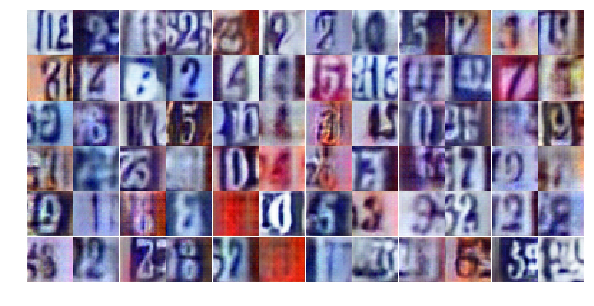

Epoch 16/20... Discriminator Loss: 1.4413... Generator Loss: 0.4684
Epoch 16/20... Discriminator Loss: 0.9135... Generator Loss: 0.8872
Epoch 16/20... Discriminator Loss: 0.9531... Generator Loss: 1.0509
Epoch 16/20... Discriminator Loss: 0.7980... Generator Loss: 1.5760
Epoch 16/20... Discriminator Loss: 0.5549... Generator Loss: 1.7527
Epoch 16/20... Discriminator Loss: 0.9993... Generator Loss: 0.7693
Epoch 16/20... Discriminator Loss: 0.8321... Generator Loss: 1.2115
Epoch 16/20... Discriminator Loss: 0.8949... Generator Loss: 0.9573
Epoch 16/20... Discriminator Loss: 0.6987... Generator Loss: 1.2840
Epoch 17/20... Discriminator Loss: 1.1197... Generator Loss: 0.7531


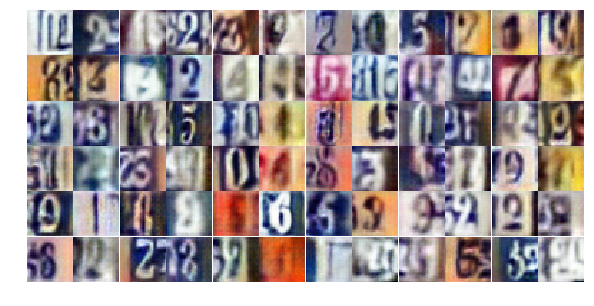

Epoch 17/20... Discriminator Loss: 0.8409... Generator Loss: 1.4199
Epoch 17/20... Discriminator Loss: 1.7045... Generator Loss: 2.7078
Epoch 17/20... Discriminator Loss: 1.7422... Generator Loss: 0.3747
Epoch 17/20... Discriminator Loss: 1.2769... Generator Loss: 0.4537
Epoch 17/20... Discriminator Loss: 1.0404... Generator Loss: 0.7838
Epoch 17/20... Discriminator Loss: 0.6483... Generator Loss: 1.3245
Epoch 17/20... Discriminator Loss: 1.1479... Generator Loss: 0.6020
Epoch 17/20... Discriminator Loss: 2.1403... Generator Loss: 0.2207
Epoch 17/20... Discriminator Loss: 1.0205... Generator Loss: 0.6974
Epoch 17/20... Discriminator Loss: 1.2280... Generator Loss: 0.6188


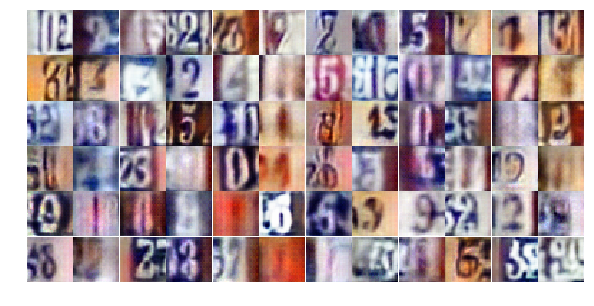

Epoch 17/20... Discriminator Loss: 1.3270... Generator Loss: 0.6259
Epoch 17/20... Discriminator Loss: 1.2176... Generator Loss: 0.5826
Epoch 17/20... Discriminator Loss: 0.9126... Generator Loss: 0.7888
Epoch 17/20... Discriminator Loss: 1.6920... Generator Loss: 0.3043
Epoch 17/20... Discriminator Loss: 0.8460... Generator Loss: 0.7483
Epoch 17/20... Discriminator Loss: 0.4977... Generator Loss: 1.5583
Epoch 17/20... Discriminator Loss: 0.8702... Generator Loss: 1.0850
Epoch 17/20... Discriminator Loss: 1.4281... Generator Loss: 0.4210
Epoch 17/20... Discriminator Loss: 0.9837... Generator Loss: 1.1051
Epoch 17/20... Discriminator Loss: 1.0641... Generator Loss: 2.5420


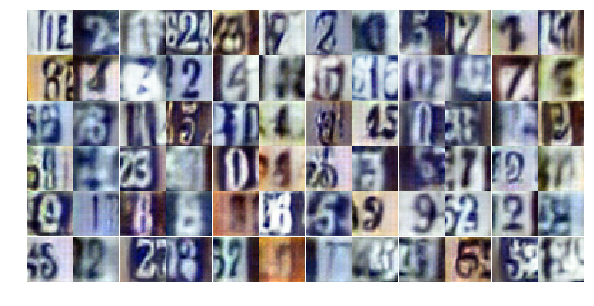

Epoch 17/20... Discriminator Loss: 1.2758... Generator Loss: 0.5291
Epoch 17/20... Discriminator Loss: 1.3170... Generator Loss: 0.5207
Epoch 17/20... Discriminator Loss: 0.6712... Generator Loss: 1.1869
Epoch 17/20... Discriminator Loss: 0.4337... Generator Loss: 1.5989
Epoch 17/20... Discriminator Loss: 0.8357... Generator Loss: 2.0896
Epoch 17/20... Discriminator Loss: 1.7037... Generator Loss: 0.3714
Epoch 17/20... Discriminator Loss: 1.1574... Generator Loss: 0.8534
Epoch 18/20... Discriminator Loss: 0.9878... Generator Loss: 1.3982
Epoch 18/20... Discriminator Loss: 1.0428... Generator Loss: 0.8911
Epoch 18/20... Discriminator Loss: 0.8337... Generator Loss: 1.1425


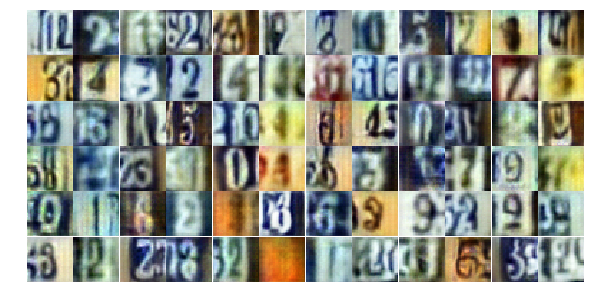

Epoch 18/20... Discriminator Loss: 1.1027... Generator Loss: 1.5307
Epoch 18/20... Discriminator Loss: 0.7304... Generator Loss: 1.0448
Epoch 18/20... Discriminator Loss: 0.5659... Generator Loss: 1.1665
Epoch 18/20... Discriminator Loss: 1.1994... Generator Loss: 1.0958
Epoch 18/20... Discriminator Loss: 1.4458... Generator Loss: 0.4112
Epoch 18/20... Discriminator Loss: 0.4138... Generator Loss: 1.6113
Epoch 18/20... Discriminator Loss: 0.7351... Generator Loss: 1.3442
Epoch 18/20... Discriminator Loss: 0.5001... Generator Loss: 1.8507
Epoch 18/20... Discriminator Loss: 1.1336... Generator Loss: 1.0431
Epoch 18/20... Discriminator Loss: 0.8756... Generator Loss: 0.9015


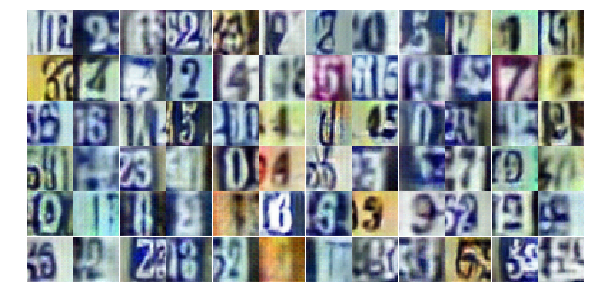

Epoch 18/20... Discriminator Loss: 1.4715... Generator Loss: 0.4158
Epoch 18/20... Discriminator Loss: 1.1383... Generator Loss: 1.2765
Epoch 18/20... Discriminator Loss: 0.8538... Generator Loss: 1.3971
Epoch 18/20... Discriminator Loss: 1.8893... Generator Loss: 0.2490
Epoch 18/20... Discriminator Loss: 0.9811... Generator Loss: 0.7731
Epoch 18/20... Discriminator Loss: 1.1737... Generator Loss: 0.5128
Epoch 18/20... Discriminator Loss: 1.0875... Generator Loss: 0.6871
Epoch 18/20... Discriminator Loss: 2.2836... Generator Loss: 2.9683
Epoch 18/20... Discriminator Loss: 1.0620... Generator Loss: 0.8577
Epoch 18/20... Discriminator Loss: 0.9856... Generator Loss: 0.9115


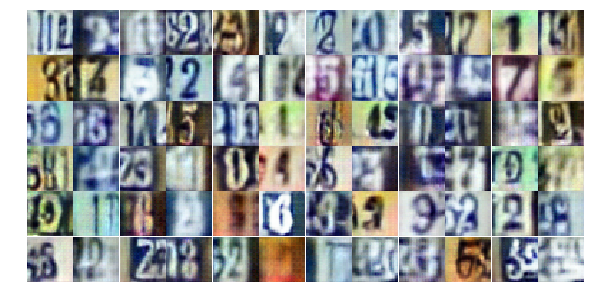

Epoch 18/20... Discriminator Loss: 1.8106... Generator Loss: 0.3185
Epoch 18/20... Discriminator Loss: 0.7349... Generator Loss: 1.7998
Epoch 18/20... Discriminator Loss: 0.8684... Generator Loss: 0.9385
Epoch 18/20... Discriminator Loss: 0.7909... Generator Loss: 1.1704
Epoch 18/20... Discriminator Loss: 1.1590... Generator Loss: 0.8262
Epoch 18/20... Discriminator Loss: 0.3971... Generator Loss: 1.7455
Epoch 19/20... Discriminator Loss: 0.6737... Generator Loss: 1.9612
Epoch 19/20... Discriminator Loss: 0.4353... Generator Loss: 1.6101
Epoch 19/20... Discriminator Loss: 0.2833... Generator Loss: 6.5284
Epoch 19/20... Discriminator Loss: 1.3593... Generator Loss: 0.7513


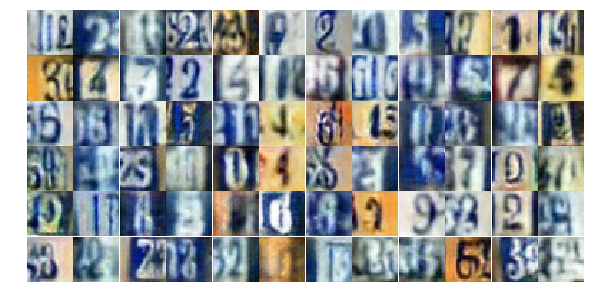

Epoch 19/20... Discriminator Loss: 1.0080... Generator Loss: 0.9522
Epoch 19/20... Discriminator Loss: 0.8999... Generator Loss: 0.8995
Epoch 19/20... Discriminator Loss: 1.1002... Generator Loss: 0.6901
Epoch 19/20... Discriminator Loss: 0.8896... Generator Loss: 1.1227
Epoch 19/20... Discriminator Loss: 1.0203... Generator Loss: 0.9915
Epoch 19/20... Discriminator Loss: 1.1296... Generator Loss: 0.5699
Epoch 19/20... Discriminator Loss: 1.2219... Generator Loss: 0.5835
Epoch 19/20... Discriminator Loss: 1.5891... Generator Loss: 2.7479
Epoch 19/20... Discriminator Loss: 0.8334... Generator Loss: 1.1235
Epoch 19/20... Discriminator Loss: 1.0497... Generator Loss: 1.4816


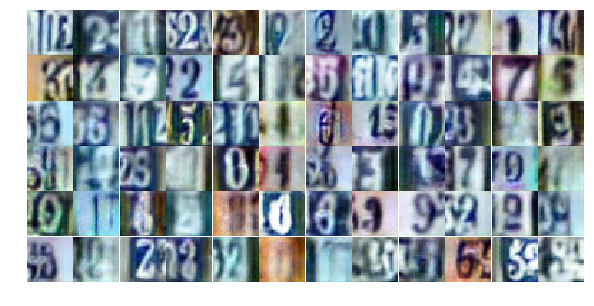

Epoch 19/20... Discriminator Loss: 0.8357... Generator Loss: 1.0853
Epoch 19/20... Discriminator Loss: 1.0057... Generator Loss: 0.6417
Epoch 19/20... Discriminator Loss: 1.0685... Generator Loss: 0.6846
Epoch 19/20... Discriminator Loss: 0.9710... Generator Loss: 0.7678
Epoch 19/20... Discriminator Loss: 0.9626... Generator Loss: 0.9226
Epoch 19/20... Discriminator Loss: 0.9956... Generator Loss: 1.8460
Epoch 19/20... Discriminator Loss: 1.2901... Generator Loss: 0.5272
Epoch 19/20... Discriminator Loss: 0.9235... Generator Loss: 1.2424
Epoch 19/20... Discriminator Loss: 0.8557... Generator Loss: 1.0168
Epoch 19/20... Discriminator Loss: 0.7587... Generator Loss: 1.4518


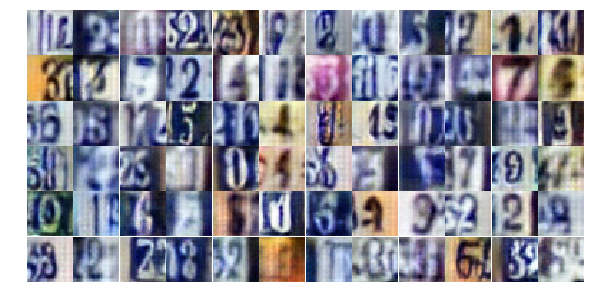

Epoch 19/20... Discriminator Loss: 0.6550... Generator Loss: 1.1116
Epoch 19/20... Discriminator Loss: 0.6277... Generator Loss: 1.5202
Epoch 19/20... Discriminator Loss: 1.2266... Generator Loss: 1.0136
Epoch 19/20... Discriminator Loss: 1.2422... Generator Loss: 0.6802
Epoch 19/20... Discriminator Loss: 1.2579... Generator Loss: 0.5305
Epoch 20/20... Discriminator Loss: 0.6929... Generator Loss: 1.1527
Epoch 20/20... Discriminator Loss: 0.9450... Generator Loss: 0.8484
Epoch 20/20... Discriminator Loss: 1.8853... Generator Loss: 0.2652
Epoch 20/20... Discriminator Loss: 1.3291... Generator Loss: 0.5264
Epoch 20/20... Discriminator Loss: 0.4378... Generator Loss: 1.5443


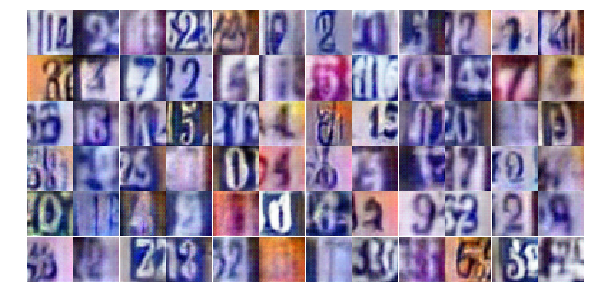

Epoch 20/20... Discriminator Loss: 2.0743... Generator Loss: 0.2264
Epoch 20/20... Discriminator Loss: 1.1500... Generator Loss: 1.1385
Epoch 20/20... Discriminator Loss: 0.9863... Generator Loss: 1.5591
Epoch 20/20... Discriminator Loss: 0.9250... Generator Loss: 1.1106
Epoch 20/20... Discriminator Loss: 0.8538... Generator Loss: 0.8971
Epoch 20/20... Discriminator Loss: 0.5352... Generator Loss: 2.0909
Epoch 20/20... Discriminator Loss: 0.5409... Generator Loss: 1.3237
Epoch 20/20... Discriminator Loss: 0.8223... Generator Loss: 0.9892
Epoch 20/20... Discriminator Loss: 0.5498... Generator Loss: 1.4024
Epoch 20/20... Discriminator Loss: 2.2620... Generator Loss: 0.1796


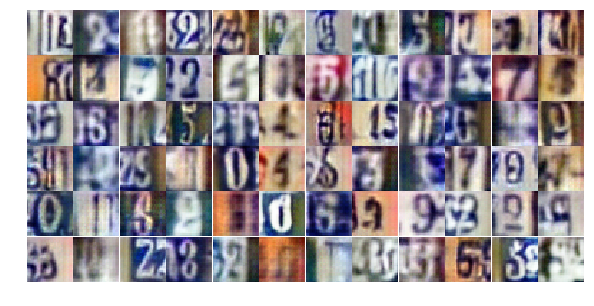

Epoch 20/20... Discriminator Loss: 0.8033... Generator Loss: 1.3270
Epoch 20/20... Discriminator Loss: 1.4137... Generator Loss: 0.4429
Epoch 20/20... Discriminator Loss: 0.7468... Generator Loss: 3.1505
Epoch 20/20... Discriminator Loss: 1.1743... Generator Loss: 1.9897
Epoch 20/20... Discriminator Loss: 0.7664... Generator Loss: 0.9579
Epoch 20/20... Discriminator Loss: 1.1342... Generator Loss: 0.6239
Epoch 20/20... Discriminator Loss: 1.5546... Generator Loss: 0.3877
Epoch 20/20... Discriminator Loss: 0.9473... Generator Loss: 1.6023
Epoch 20/20... Discriminator Loss: 0.8469... Generator Loss: 1.7241
Epoch 20/20... Discriminator Loss: 0.1711... Generator Loss: 2.8915


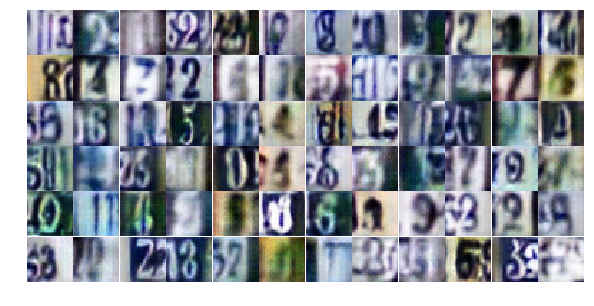

Epoch 20/20... Discriminator Loss: 1.0635... Generator Loss: 2.6412
Epoch 20/20... Discriminator Loss: 0.8890... Generator Loss: 1.2025
Epoch 20/20... Discriminator Loss: 1.0881... Generator Loss: 1.0179
Epoch 20/20... Discriminator Loss: 0.8574... Generator Loss: 0.7876


In [41]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

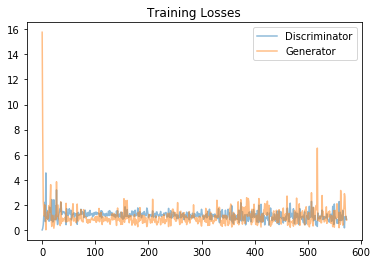

In [42]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

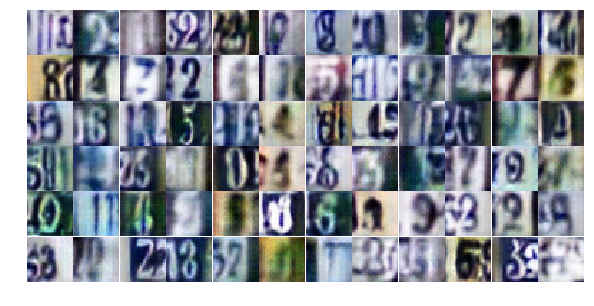

In [43]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))